<a href="https://colab.research.google.com/github/sugarchins/ML-NLP-Projects/blob/main/Student's_Social_Network_Profile_Clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Student's Social Network Profile Clustering


**Problem Statement:** The objective is to use the given student social media dataset to analyse data and use K-Means, Hierarchical and  DBSCAN unsupervised machine learning algorithims to create Clusters to understand the data better.Compare the clustering results using the Silhouette Score, which measures the quality of clustering, and identify the most appropriate clustering algorithm for the dataset.
This analysis will allow us to better understand student behaviors, interests, and social network trends, providing valuable insights for educational institutions, social platforms, or marketing efforts targeting students.





In [ ]:
#Importing Libraries
import numpy as np
import pandas as pd
import matplotlib
#for visualizations
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df=pd.read_csv('/content/03_Clustering_Marketing.csv')

In [ ]:
df.head()

,gradyear,gender,age,NumberOffriends,basketball,football,soccer,softball,volleyball,swimming,...,blonde,mall,shopping,clothes,hollister,abercrombie,die,death,drunk,drugs
0,2007,NaN,NaN,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2007,F,17.41,49,0,0,1,0,0,1,...,0,0,0,0,0,0,0,0,1,0
2,2007,F,17.511,41,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,1,1
3,2006,F,NaN,36,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,2008,F,16.657,1,0,0,0,0,0,1,...,0,0,0,3,0,0,0,0,0,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 40 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   gradyear         15000 non-null  int64 
 1   gender           13663 non-null  object
 2   age              12504 non-null  object
 3   NumberOffriends  15000 non-null  int64 
 4   basketball       15000 non-null  int64 
 5   football         15000 non-null  int64 
 6   soccer           15000 non-null  int64 
 7   softball         15000 non-null  int64 
 8   volleyball       15000 non-null  int64 
 9   swimming         15000 non-null  int64 
 10  cheerleading     15000 non-null  int64 
 11  baseball         15000 non-null  int64 
 12  tennis           15000 non-null  int64 
 13  sports           15000 non-null  int64 
 14  cute             15000 non-null  int64 
 15  sex              15000 non-null  int64 
 16  sexy             15000 non-null  int64 
 17  hot              15000 non-null

In [ ]:
df.shape

(15000, 40)

In [ ]:
df.columns

Index(['gradyear', 'gender', 'age', 'NumberOffriends', 'basketball',
       'football', 'soccer', 'softball', 'volleyball', 'swimming',
       'cheerleading', 'baseball', 'tennis', 'sports', 'cute', 'sex', 'sexy',
       'hot', 'kissed', 'dance', 'band', 'marching', 'music', 'rock', 'god',
       'church', 'jesus', 'bible', 'hair', 'dress', 'blonde', 'mall',
       'shopping', 'clothes', 'hollister', 'abercrombie', 'die', 'death',
       'drunk', 'drugs'],
      dtype='object')

In [ ]:
#Convert the first letter of each column name to uppercase
new_columns = []
for col in df.columns:
    new_columns.append(col[0].upper() + col[1:])

df.columns = new_columns
df.columns


Index(['Gradyear', 'Gender', 'Age', 'NumberOffriends', 'Basketball',
       'Football', 'Soccer', 'Softball', 'Volleyball', 'Swimming',
       'Cheerleading', 'Baseball', 'Tennis', 'Sports', 'Cute', 'Sex', 'Sexy',
       'Hot', 'Kissed', 'Dance', 'Band', 'Marching', 'Music', 'Rock', 'God',
       'Church', 'Jesus', 'Bible', 'Hair', 'Dress', 'Blonde', 'Mall',
       'Shopping', 'Clothes', 'Hollister', 'Abercrombie', 'Die', 'Death',
       'Drunk', 'Drugs'],
      dtype='object')

In [ ]:
df.isnull().sum()

,0
Gradyear,0
Gender,1337
Age,2496
NumberOffriends,0
Basketball,0
Football,0
Soccer,0
Softball,0
Volleyball,0
Swimming,0



As we can observe 'Age' and 'Gender' features have missing values lets deal with the missing values

In [ ]:
df['Gender'].value_counts(dropna = False)

,count
Gender,
F,11057
M,2606
NaN,1337


In [ ]:
df['Gender'].fillna(df['Gender'].mode()[0], inplace=True)

<ipython-input-13-90613879d37d>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Gender'].fillna(df['Gender'].mode()[0], inplace=True)


In [ ]:
#Dealing with Age varaiable
df['Age'] = df['Age'].astype(str)
df['Age'] = df['Age'].str.extract('(\d+)').astype(float)
df['Age'] = df['Age'].fillna(df['Age'].median())
print(df.isnull().sum())


Gradyear           0
Gender             0
Age                0
NumberOffriends    0
Basketball         0
Football           0
Soccer             0
Softball           0
Volleyball         0
Swimming           0
Cheerleading       0
Baseball           0
Tennis             0
Sports             0
Cute               0
Sex                0
Sexy               0
Hot                0
Kissed             0
Dance              0
Band               0
Marching           0
Music              0
Rock               0
God                0
Church             0
Jesus              0
Bible              0
Hair               0
Dress              0
Blonde             0
Mall               0
Shopping           0
Clothes            0
Hollister          0
Abercrombie        0
Die                0
Death              0
Drunk              0
Drugs              0
dtype: int64


In [ ]:
df['Age'] = df['Age'].astype(int)
df.Age

,Age
0,17
1,17
2,17
3,17
4,16
...,...
14995,16
14996,16
14997,17
14998,17


In [ ]:
df.describe()

,Gradyear,Age,NumberOffriends,Basketball,Football,Soccer,Softball,Volleyball,Swimming,Cheerleading,...,Blonde,Mall,Shopping,Clothes,Hollister,Abercrombie,Die,Death,Drunk,Drugs
count,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.00000,15000.000000,15000.000000,15000.000000,15000.000000,...,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000
mean,2007.496933,17.397933,29.834533,0.267000,0.255467,0.22200,0.159667,0.142933,0.135000,0.105133,...,0.112867,0.259467,0.357267,0.150267,0.071800,0.051467,0.185867,0.118067,0.091733,0.061067
std,1.116516,6.976677,35.386649,0.788851,0.702260,0.92042,0.737344,0.638747,0.548691,0.502491,...,2.708619,0.704398,0.728512,0.478716,0.356258,0.280755,0.609928,0.455200,0.420631,0.349112
min,2006.000000,4.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2006.000000,16.000000,3.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2008.000000,17.000000,20.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2008.000000,18.000000,44.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,2009.000000,106.000000,605.000000,22.000000,9.000000,22.00000,17.000000,14.000000,31.000000,8.000000,...,327.000000,12.000000,11.000000,8.000000,8.000000,8.000000,16.000000,14.000000,8.000000,16.000000


In [ ]:
df.duplicated().sum()

864

In [ ]:
df.drop_duplicates(inplace=True)

In [ ]:
df.duplicated().sum()

0

In [ ]:
#Categorical data
cat_data=df.select_dtypes(include='object')
cat_data

,Gender
0,F
1,F
2,F
3,F
4,F
...,...
14995,F
14996,F
14997,F
14998,F


In [ ]:
#Numerical data
num=df.select_dtypes(include=np.number)
num

,Gradyear,Age,NumberOffriends,Basketball,Football,Soccer,Softball,Volleyball,Swimming,Cheerleading,...,Blonde,Mall,Shopping,Clothes,Hollister,Abercrombie,Die,Death,Drunk,Drugs
0,2007,17,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2007,17,49,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,1,0
2,2007,17,41,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,1,1
3,2006,17,36,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,2008,16,1,0,0,0,0,0,1,0,...,0,0,0,3,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14995,2008,16,21,0,0,0,0,0,0,0,...,0,0,0,2,0,0,0,1,0,0
14996,2008,16,50,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
14997,2007,17,32,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
14998,2007,17,20,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
num.corr()

,Gradyear,Age,NumberOffriends,Basketball,Football,Soccer,Softball,Volleyball,Swimming,Cheerleading,...,Blonde,Mall,Shopping,Clothes,Hollister,Abercrombie,Die,Death,Drunk,Drugs
Gradyear,1.000000,-0.095348,0.069395,0.070621,0.027375,0.045889,0.038977,0.056765,0.033908,0.048348,...,0.004507,0.068029,0.045939,0.032179,0.054405,0.057239,0.000874,-0.002359,-0.028240,0.003450
Age,-0.095348,1.000000,-0.016129,-0.022067,-0.015034,-0.006861,-0.015153,-0.026807,-0.015089,-0.018098,...,-0.000705,-0.026712,-0.028594,-0.017968,-0.003967,-0.011134,0.002069,0.002414,-0.011385,0.007196
NumberOffriends,0.069395,-0.016129,1.000000,0.039974,0.026639,0.014226,0.048052,0.050473,0.022851,0.046786,...,0.008035,0.069559,0.058802,0.011582,0.042245,0.053161,0.000509,0.021406,0.010933,-0.025218
Basketball,0.070621,-0.022067,0.039974,1.000000,0.172628,0.064581,0.111431,0.131003,0.021819,0.035300,...,0.010240,0.056061,0.055657,0.067625,0.040547,0.041868,0.016840,0.014976,0.034016,0.036156
Football,0.027375,-0.015034,0.026639,0.172628,1.000000,0.067421,0.041588,0.056792,0.033654,0.078632,...,0.031657,0.050640,0.046526,0.057072,0.037005,0.043431,0.022163,0.014606,0.044958,0.018245
Soccer,0.045889,-0.006861,0.014226,0.064581,0.067421,1.000000,0.016284,0.030276,0.034468,0.018924,...,0.008374,0.024585,0.058752,0.021238,0.024344,0.015833,0.009560,0.003899,0.010186,0.018992
Softball,0.038977,-0.015153,0.048052,0.111431,0.041588,0.016284,1.000000,0.099944,0.020796,0.023840,...,0.004361,0.024624,0.057119,0.044712,0.017714,0.008801,0.005963,0.011846,0.010988,0.005159
Volleyball,0.056765,-0.026807,0.050473,0.131003,0.056792,0.030276,0.099944,1.000000,0.031977,0.016244,...,0.003643,0.034648,0.075966,0.021566,0.039267,0.045067,-0.000996,0.011669,0.012022,0.008413
Swimming,0.033908,-0.015089,0.022851,0.021819,0.033654,0.034468,0.020796,0.031977,1.000000,0.017396,...,0.019472,0.039982,0.101534,0.065084,0.045526,0.051941,0.016108,0.008872,0.027333,0.034579
Cheerleading,0.048348,-0.018098,0.046786,0.035300,0.078632,0.018924,0.023840,0.016244,0.017396,1.000000,...,0.015618,0.054305,0.098632,0.024484,0.069431,0.079085,0.014416,0.001983,0.021066,0.021287


<Axes: >

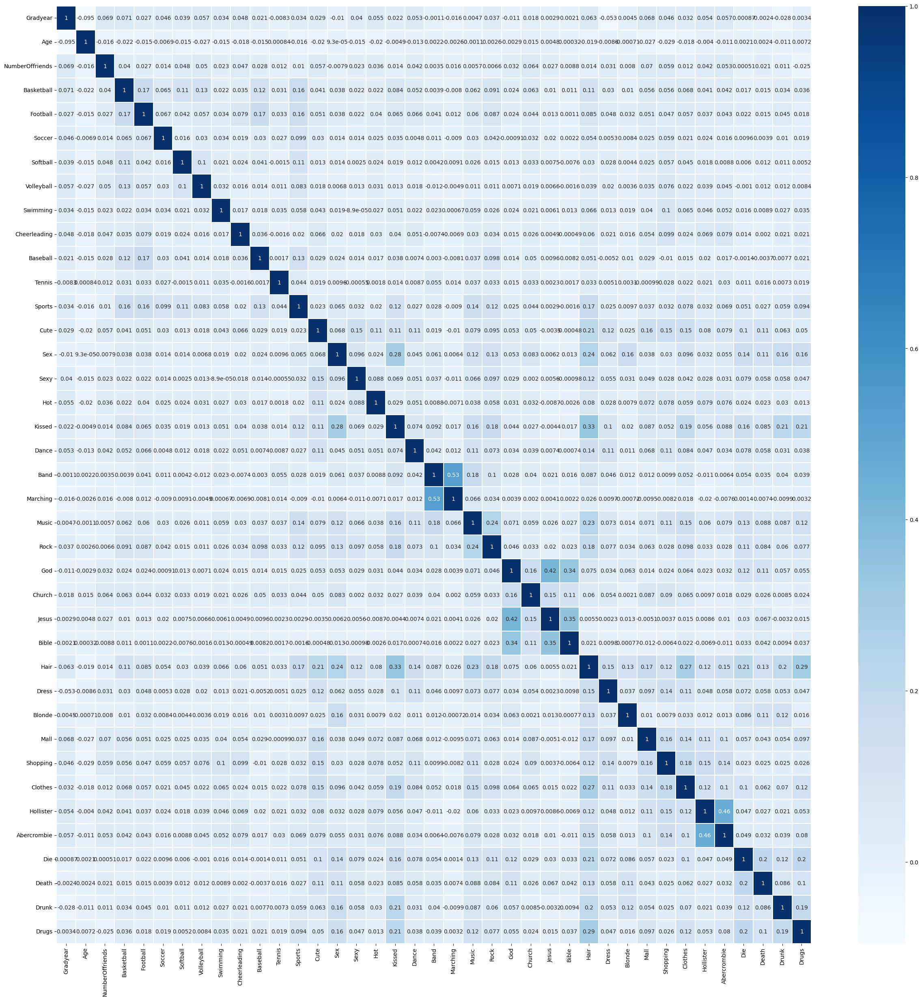

In [ ]:
plt.figure(figsize=(30,30))
sns.heatmap(num.corr(), annot=True, linewidth="0.2",cmap='Blues')

In [ ]:
corr_matrix = df2.corr()
def categorize_correlation(corr_value):
    if corr_value >= 0.7:
        return 'Strong'
    elif corr_value >= 0.3:
        return 'Moderate'
    else:
        return 'Low'

# Create a categorized correlation matrix
categorized_corr = corr_matrix.applymap(categorize_correlation)



#print("Correlation Matrix:")
#print(corr_matrix)

print("\nCategorized Correlation Matrix:")
#print(categorized_corr)
categorized_corr


Categorized Correlation Matrix:


,Gradyear,Gender,Age,NumberOffriends,Basketball,Football,Soccer,Softball,Volleyball,Swimming,...,Blonde,Mall,Shopping,Clothes,Hollister,Abercrombie,Die,Death,Drunk,Drugs
Gradyear,Strong,Low,Low,Low,Low,Low,Low,Low,Low,Low,...,Low,Low,Low,Low,Low,Low,Low,Low,Low,Low
Gender,Low,Strong,Low,Low,Low,Low,Low,Low,Low,Low,...,Low,Low,Low,Low,Low,Low,Low,Low,Low,Low
Age,Low,Low,Strong,Low,Low,Low,Low,Low,Low,Low,...,Low,Low,Low,Low,Low,Low,Low,Low,Low,Low
NumberOffriends,Low,Low,Low,Strong,Low,Low,Low,Low,Low,Low,...,Low,Low,Low,Low,Low,Low,Low,Low,Low,Low
Basketball,Low,Low,Low,Low,Strong,Low,Low,Low,Low,Low,...,Low,Low,Low,Low,Low,Low,Low,Low,Low,Low
Football,Low,Low,Low,Low,Low,Strong,Low,Low,Low,Low,...,Low,Low,Low,Low,Low,Low,Low,Low,Low,Low
Soccer,Low,Low,Low,Low,Low,Low,Strong,Low,Low,Low,...,Low,Low,Low,Low,Low,Low,Low,Low,Low,Low
Softball,Low,Low,Low,Low,Low,Low,Low,Strong,Low,Low,...,Low,Low,Low,Low,Low,Low,Low,Low,Low,Low
Volleyball,Low,Low,Low,Low,Low,Low,Low,Low,Strong,Low,...,Low,Low,Low,Low,Low,Low,Low,Low,Low,Low
Swimming,Low,Low,Low,Low,Low,Low,Low,Low,Low,Strong,...,Low,Low,Low,Low,Low,Low,Low,Low,Low,Low


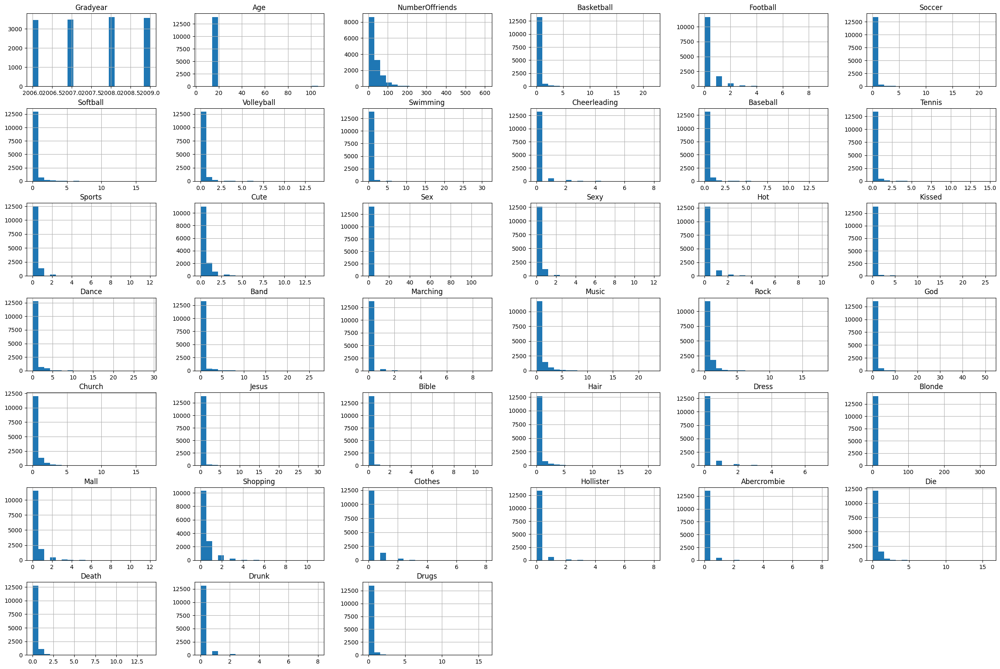

In [ ]:
# Distribution of the numerical features
df.hist(bins=20, figsize=(30, 20))
plt.show()

In [ ]:
sns.pairplot(df)
plt.show()

In [ ]:
#converting categorical data into numerical data
df1=df.copy()
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df1['Gender'] = le.fit_transform(df1['Gender'])
df1.head()


,Gradyear,Gender,Age,NumberOffriends,Basketball,Football,Soccer,Softball,Volleyball,Swimming,...,Blonde,Mall,Shopping,Clothes,Hollister,Abercrombie,Die,Death,Drunk,Drugs
0,2007,0,17,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2007,0,17,49,0,0,1,0,0,1,...,0,0,0,0,0,0,0,0,1,0
2,2007,0,17,41,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,1,1
3,2006,0,17,36,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,2008,0,16,1,0,0,0,0,0,1,...,0,0,0,3,0,0,0,0,0,0


In [ ]:
df1.skew()

,0
Gradyear,-0.023387
Gender,1.701090
Age,11.266039
NumberOffriends,2.697547
Basketball,5.517250
Football,3.984203
Soccer,7.060783
Softball,7.609135
Volleyball,7.321969
Swimming,15.963560


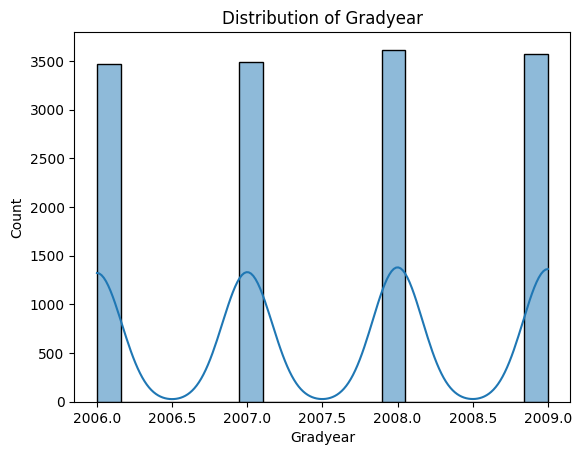

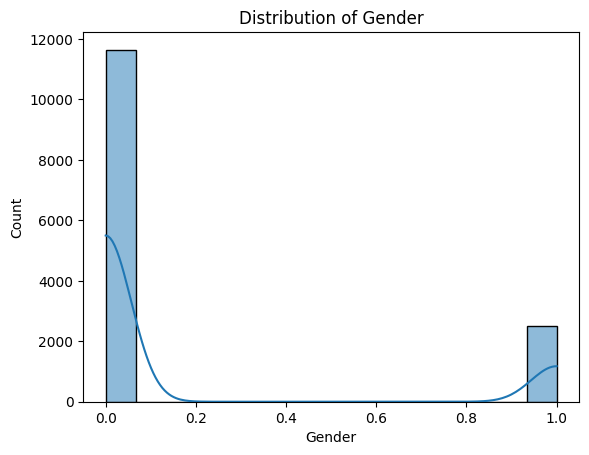

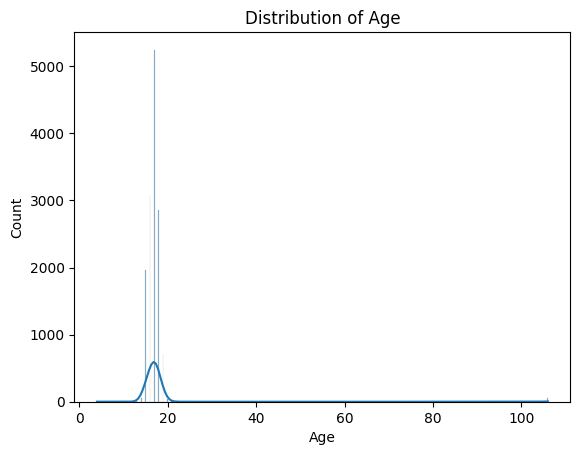

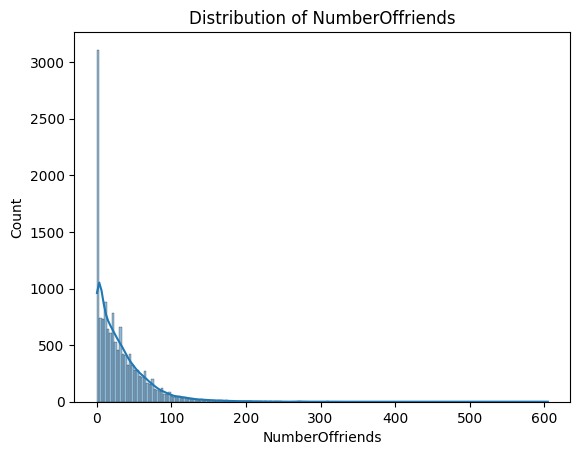

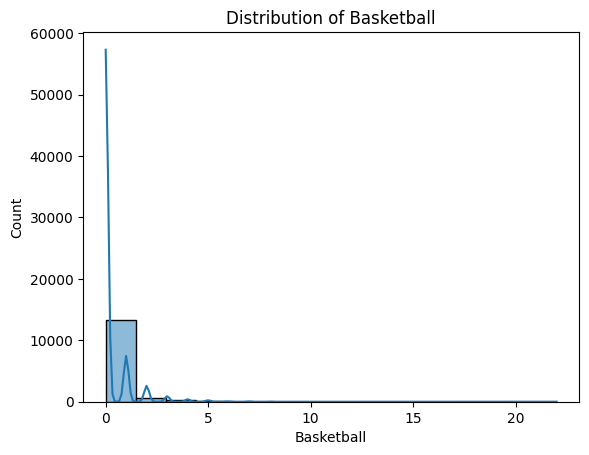

...

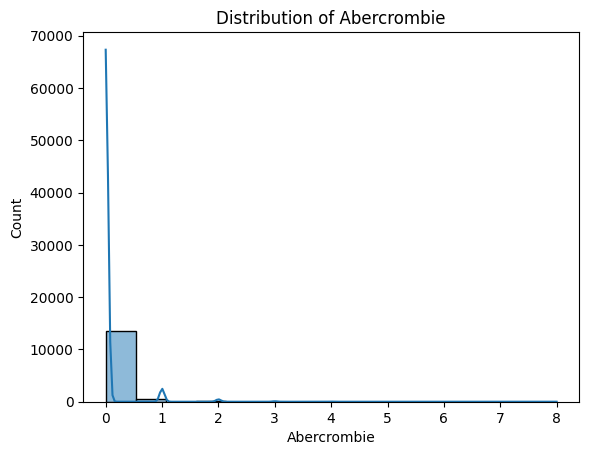

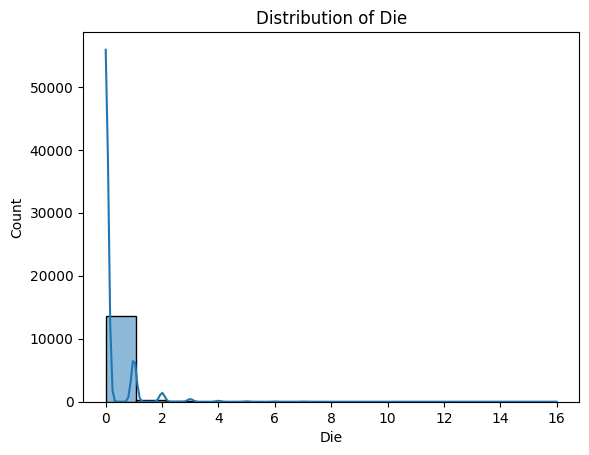

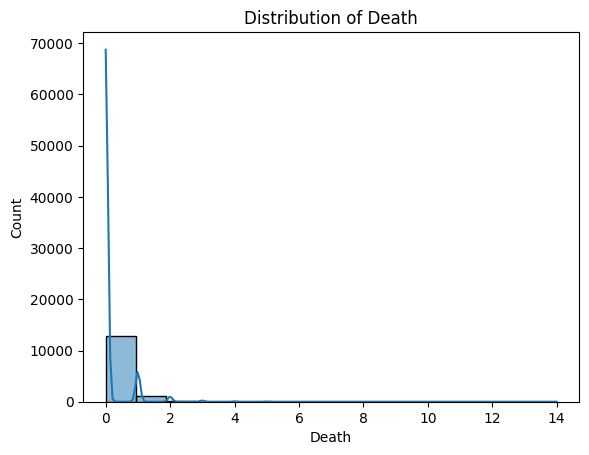

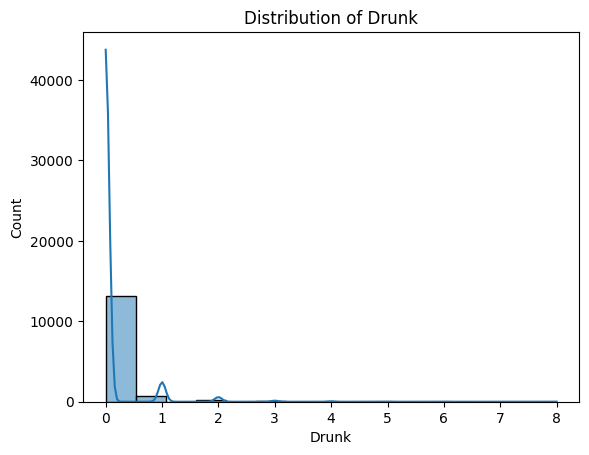

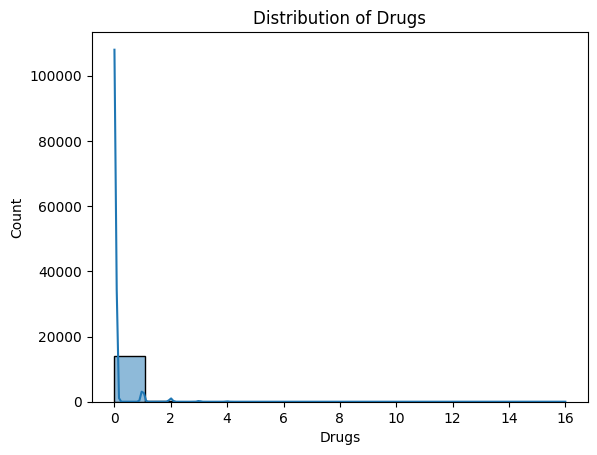

In [ ]:
for col in df1.select_dtypes(include=['float64', 'int64']).columns:
    sns.histplot(df1[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.show()

In [ ]:
skewness = df1.skew()
skewness
def Level_of_skewness(s):
    if s > 1 or s < -1:
        return 'Highly Skewed'
    elif s > 0.5 or s<-0.5:
        return 'Moderately Skewed'
    else:
        return 'Lightly Skewed'

skewness_category = skewness.apply(Level_of_skewness)
print(skewness_category)

Gradyear           Lightly Skewed
Gender              Highly Skewed
Age                 Highly Skewed
NumberOffriends     Highly Skewed
Basketball          Highly Skewed
Football            Highly Skewed
Soccer              Highly Skewed
Softball            Highly Skewed
Volleyball          Highly Skewed
Swimming            Highly Skewed
Cheerleading        Highly Skewed
Baseball            Highly Skewed
Tennis              Highly Skewed
Sports              Highly Skewed
Cute                Highly Skewed
Sex                 Highly Skewed
Sexy                Highly Skewed
Hot                 Highly Skewed
Kissed              Highly Skewed
Dance               Highly Skewed
Band                Highly Skewed
Marching            Highly Skewed
Music               Highly Skewed
Rock                Highly Skewed
God                 Highly Skewed
Church              Highly Skewed
Jesus               Highly Skewed
Bible               Highly Skewed
Hair                Highly Skewed
Dress         

From above result we can observe that all of the features except 'Gradyear' are highly skewed as we know the data ranges are low as compared to 'Gradyear'

In [ ]:
df2=df1.copy()#Creating copy of data

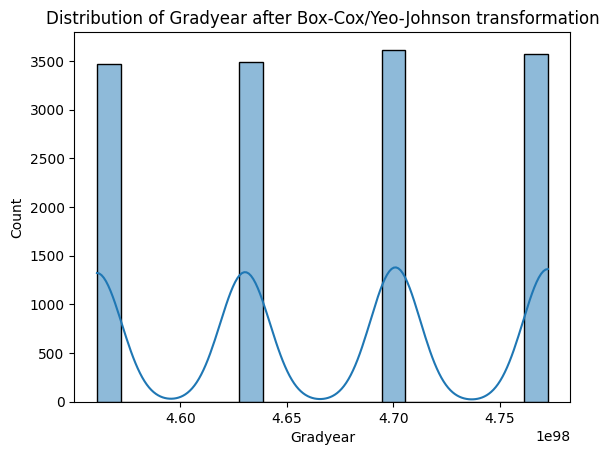

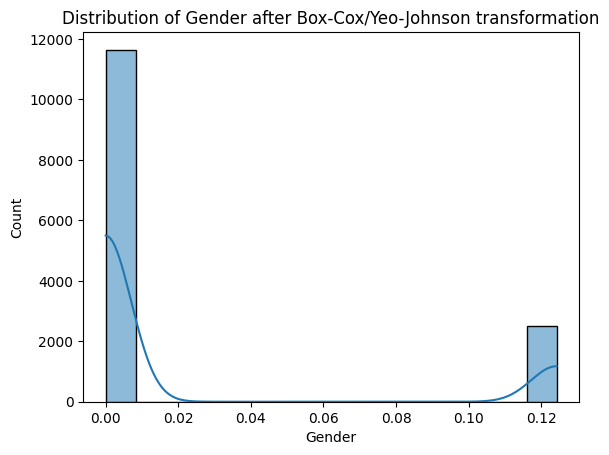

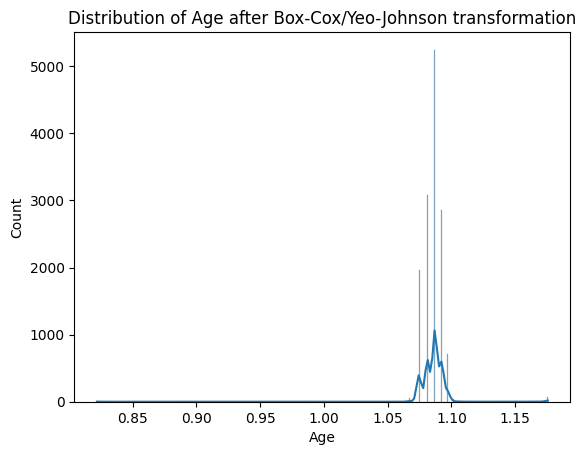

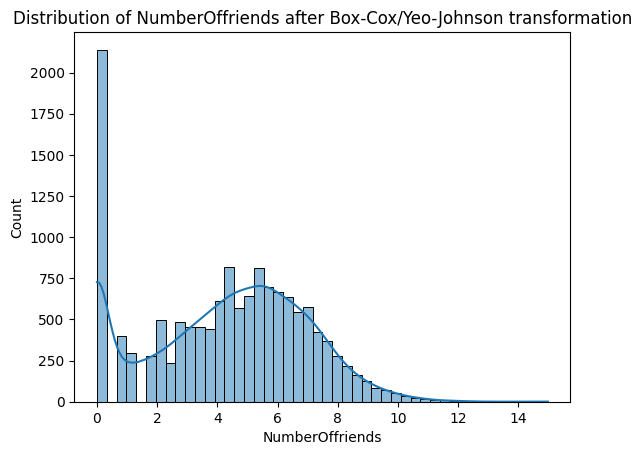

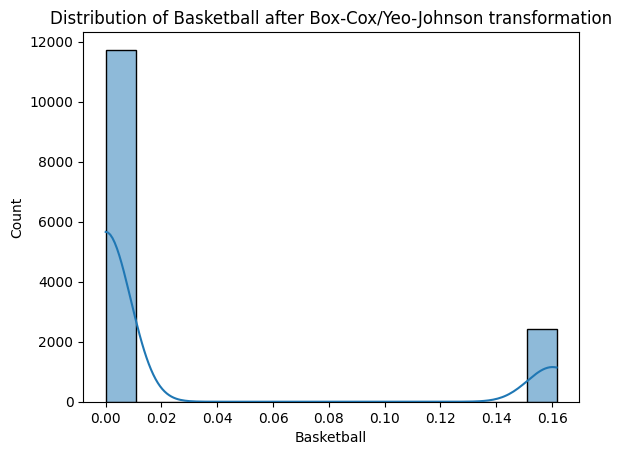

...

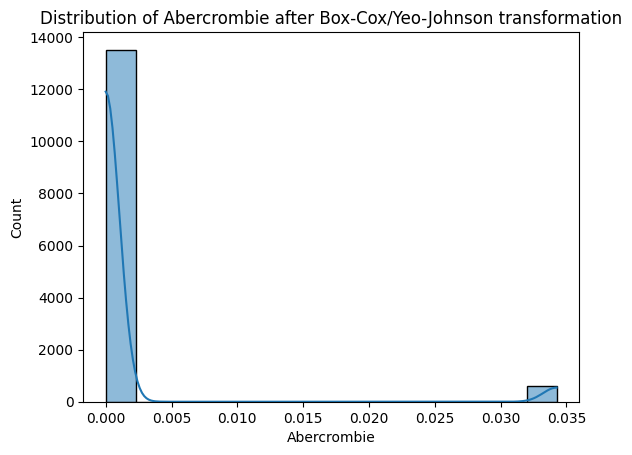

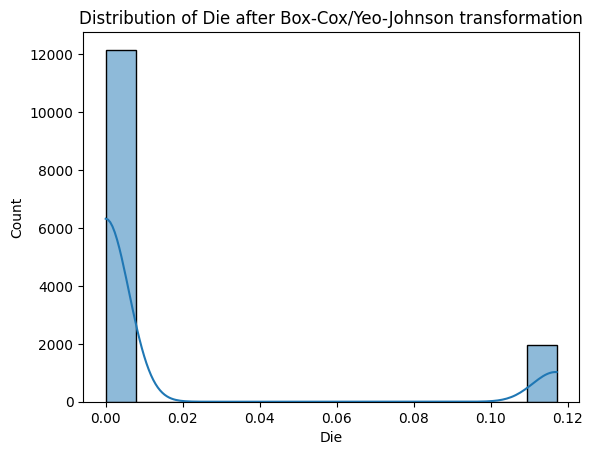

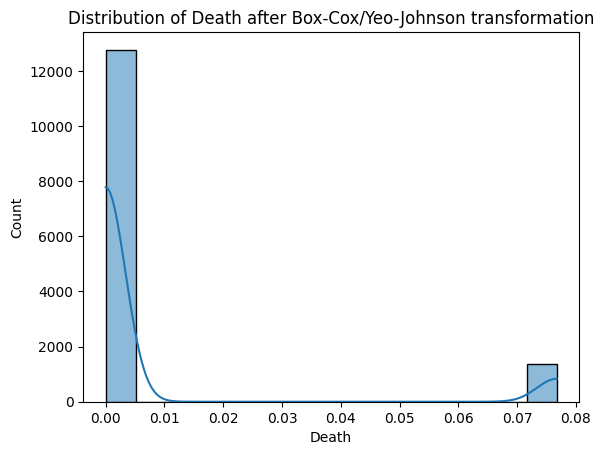

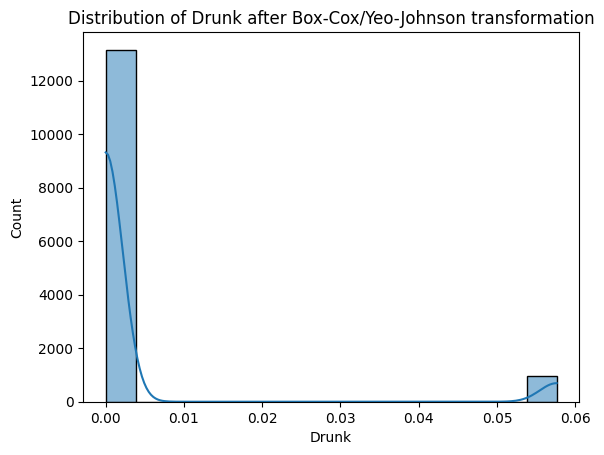

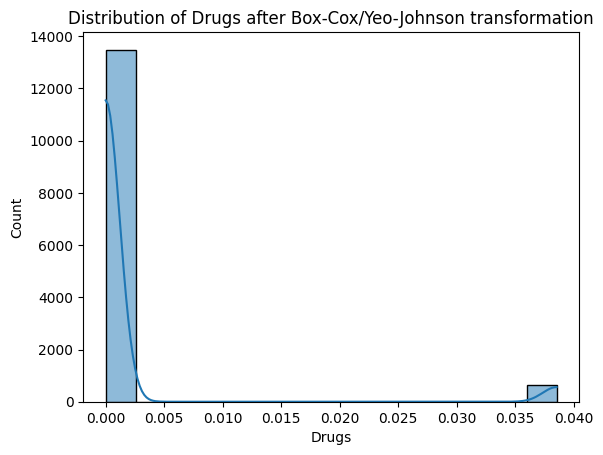

Gradyear          -0.007613
Gender             1.701090
Age               -3.221129
NumberOffriends   -0.110822
Basketball         1.753496
Football           1.695520
Soccer             2.522294
Softball           2.990517
Volleyball         2.967643
Swimming           2.572752
Cheerleading       3.529038
Baseball           3.402205
Tennis             4.004190
Sports             2.353830
Cute               1.358382
Sex                2.460029
Sexy               2.544887
Hot                2.710330
Kissed             3.484826
Dance              1.260589
Band               1.897368
Marching           5.455278
Music              0.319238
Rock               1.729009
God                0.989367
Church             1.976609
Jesus              3.096397
Bible              7.647864
Hair               1.217837
Dress              2.956341
Blonde             3.586745
Mall               1.615125
Shopping           1.034466
Clothes            2.305713
Hollister          3.841244
Abercrombie        4

In [ ]:
#Dealing with skewness

from scipy.stats import boxcox

for col in df2.select_dtypes(include=['float64', 'int64']).columns:
    # Check if all values are positive (required for Box-Cox)
    if (df2[col] > 0).all():
        df2[col], _ = boxcox(df[col])
    else:
        # If negative values present, consider Yeo-Johnson
        from scipy.stats import yeojohnson
        df2[col], _ = yeojohnson(df2[col])

    sns.histplot(df2[col], kde=True)
    plt.title(f'Distribution of {col} after Box-Cox/Yeo-Johnson transformation')
    plt.show()

print(df2.skew())


Checking for **Outliers**

In [ ]:

def check_outliers(df2):
    outliers = {}
    for column in df.select_dtypes(include=['number']).columns:
        Q1 = df2[column].quantile(0.25)
        Q3 = df2[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers[column] = df2[(df2[column] < lower_bound) | (df2[column] > upper_bound)]
        #data['Column'] = np.where(data['column'] < lower_bound, lower_bound, data['column'])
    return outliers
outliers = check_outliers(df2)
print(outliers)


{'Gradyear': Empty DataFrame
Columns: [Gradyear, Gender, Age, NumberOffriends, Basketball, Football, Soccer, Softball, Volleyball, Swimming, Cheerleading, Baseball, Tennis, Sports, Cute, Sex, Sexy, Hot, Kissed, Dance, Band, Marching, Music, Rock, God, Church, Jesus, Bible, Hair, Dress, Blonde, Mall, Shopping, Clothes, Hollister, Abercrombie, Die, Death, Drunk, Drugs]
Index: []

[0 rows x 40 columns], 'Age':            Gradyear    Gender       Age  NumberOffriends  Basketball  \
112    4.560946e+98  0.000000  0.987975         0.000000    0.000000   
117    4.630399e+98  0.000000  1.175558         4.251580    0.000000   
253    4.772387e+98  0.000000  1.175558         3.914234    0.161589   
264    4.772387e+98  0.124251  1.175363         6.326553    0.000000   
450    4.700874e+98  0.000000  1.149878         5.633260    0.000000   
...             ...       ...       ...              ...         ...   
14345  4.560946e+98  0.000000  1.170286         6.220999    0.000000   
14351  4.7008

**Plotting data without removing skewness shows outliers **

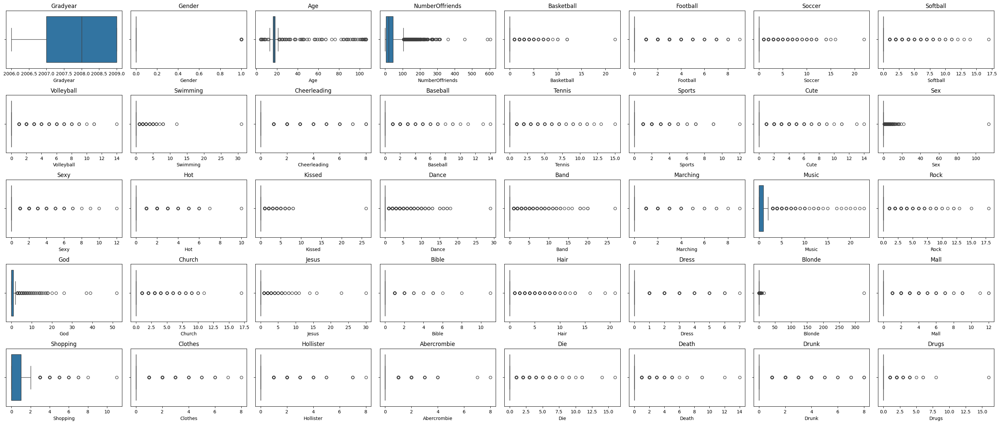

In [ ]:

plt.figure(figsize=(30, 20))

for col in df1.columns:
    plt.subplot(8, 8, df1.columns.get_loc(col) + 1)
    sns.boxplot(x=df1[col])
    plt.title(col)
plt.tight_layout()

plt.show()

The variables 'Age and 'Numberoffriends' has more outliers

In [ ]:
df4=df2.copy()

def cap_outliers(df4, column):
    Q1 = df4[column].quantile(0.25)
    Q3 = df4[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df4[column] = np.where(df4[column] < lower_bound, lower_bound, df4[column])
    df4[column] = np.where(df4[column] > upper_bound, upper_bound, df4[column])
    return df4

for col in df4.select_dtypes(include=['number']).columns:
    df4 = cap_outliers(df4, col)

In [ ]:
df2 #data afer removing skewness but without removing outliers


,Gradyear,Gender,Age,NumberOffriends,Basketball,Football,Soccer,Softball,Volleyball,Swimming,...,Blonde,Mall,Shopping,Clothes,Hollister,Abercrombie,Die,Death,Drunk,Drugs
0,4.630399e+98,0.0,1.086951,0.000000,0.0,0.0,0.000000,0.0,0.0,0.00000,...,0.0,0.000000,0.00000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
1,4.630399e+98,0.0,1.086951,6.428800,0.0,0.0,0.112097,0.0,0.0,0.08534,...,0.0,0.000000,0.00000,0.000000,0.0,0.0,0.0,0.000000,0.057613,0.000000
2,4.630399e+98,0.0,1.086951,5.998896,0.0,0.0,0.000000,0.0,0.0,0.00000,...,0.0,0.164666,0.00000,0.000000,0.0,0.0,0.0,0.000000,0.057613,0.038533
3,4.560946e+98,0.0,1.086951,5.697281,0.0,0.0,0.000000,0.0,0.0,0.00000,...,0.0,0.000000,0.00000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
4,4.700874e+98,0.0,1.081084,0.753045,0.0,0.0,0.000000,0.0,0.0,0.08534,...,0.0,0.000000,0.00000,0.098701,0.0,0.0,0.0,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14995,4.700874e+98,0.0,1.081084,4.550377,0.0,0.0,0.000000,0.0,0.0,0.00000,...,0.0,0.000000,0.00000,0.098700,0.0,0.0,0.0,0.076709,0.000000,0.000000
14996,4.700874e+98,0.0,1.081084,6.478755,0.0,0.0,0.000000,0.0,0.0,0.00000,...,0.0,0.000000,0.00000,0.000000,0.0,0.0,0.0,0.076709,0.000000,0.000000
14997,4.630399e+98,0.0,1.086951,5.432670,0.0,0.0,0.000000,0.0,0.0,0.00000,...,0.0,0.000000,0.00000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
14998,4.630399e+98,0.0,1.086951,4.454441,0.0,0.0,0.000000,0.0,0.0,0.00000,...,0.0,0.000000,0.00000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000


Plotting data (df2) after removing skewnes to show outliers:

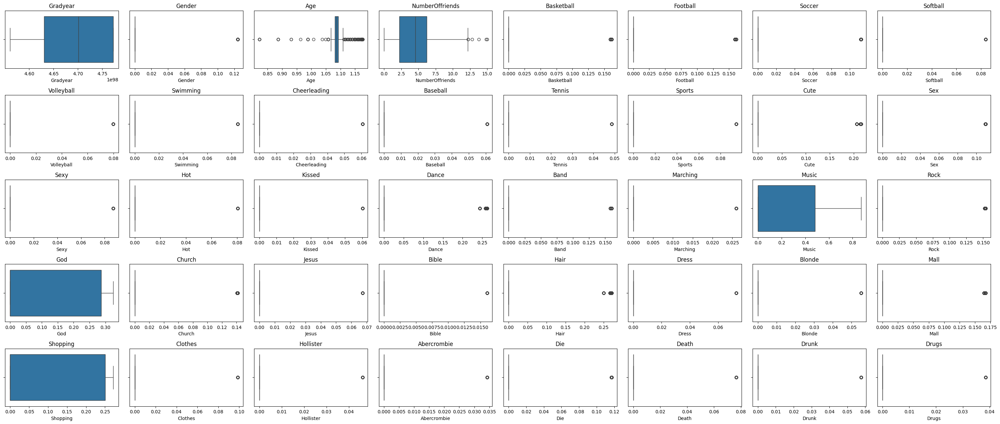

In [ ]:
#df2 without removal of outliers
plt.figure(figsize=(30, 20))

for col in df2.columns:
    plt.subplot(8, 8, df2.columns.get_loc(col) + 1)
    sns.boxplot(x=df2[col])
    plt.title(col)

plt.tight_layout()
plt.show()

**Plotting Data *(df4)* after removing outliers:**


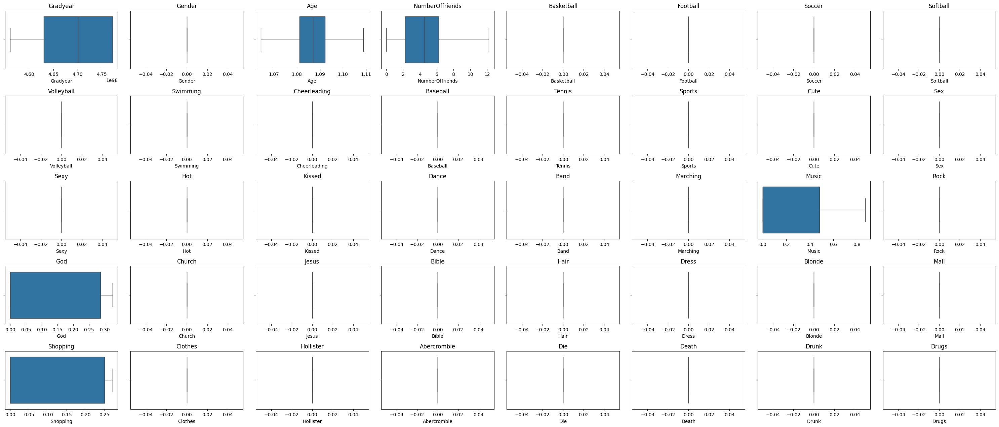

In [ ]:
#After removing outliers
plt.figure(figsize=(30, 20))
for col in df4.columns:
    plt.subplot(8, 8, df4.columns.get_loc(col) + 1)
    sns.boxplot(x=df4[col])
    plt.title(col)

plt.tight_layout()
plt.show()


In [ ]:
df4.head()

,Gradyear,Gender,Age,NumberOffriends,Basketball,Football,Soccer,Softball,Volleyball,Swimming,...,Blonde,Mall,Shopping,Clothes,Hollister,Abercrombie,Die,Death,Drunk,Drugs
0,4.630399e+98,0.0,1.086951,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,4.630399e+98,0.0,1.086951,6.428800,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,4.630399e+98,0.0,1.086951,5.998896,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4.560946e+98,0.0,1.086951,5.697281,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4.700874e+98,0.0,1.081084,0.753045,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Feature Scaling


In [ ]:
from sklearn.preprocessing import StandardScaler

# Standardizing the data (for clustering)
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df2.select_dtypes(include=['float64', 'int64']))

# Convert back to a DataFrame
df_scaled = pd.DataFrame(scaled_data, columns=df2.select_dtypes(include=['float64', 'int64']).columns)


In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
pca_components = pca.fit_transform(df_scaled)

# DataFrame with the PCA components
df_pca = pd.DataFrame(pca_components, columns=['PC1', 'PC2'])

print(f'Explained Variance Ratio: {pca.explained_variance_ratio_}')

Explained Variance Ratio: [0.08313143 0.04460879]


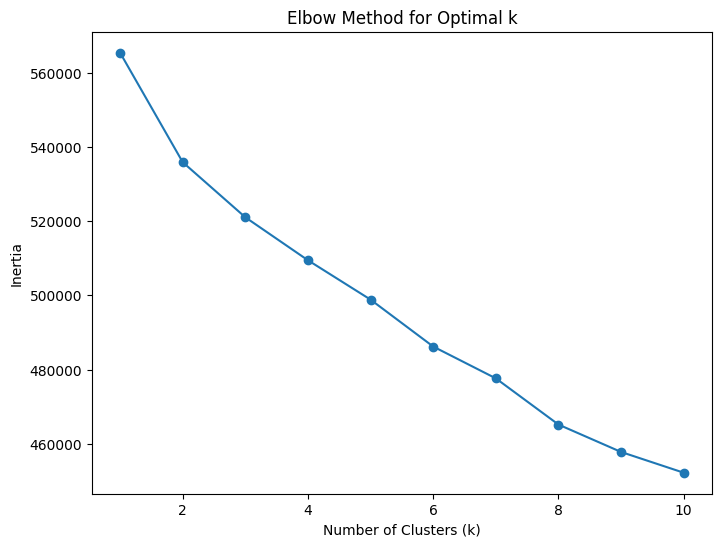

In [ ]:
#Elboe plot
from sklearn.cluster import KMeans

inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df_scaled)
    inertia.append(kmeans.inertia_)


plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.show()

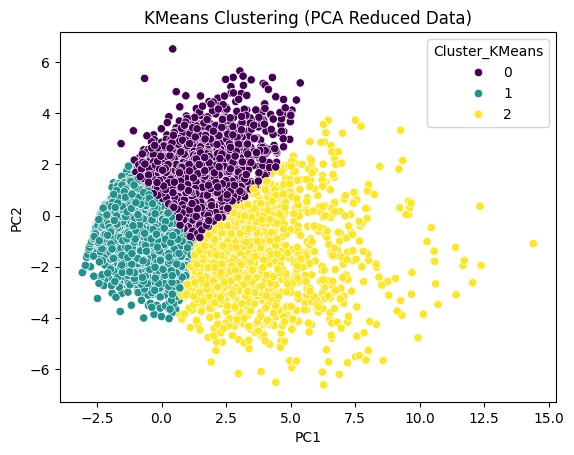

In [ ]:
#  KMeans on PCA components
#From above elbow plot we takenumber of  clusters as k= 3
kmeans = KMeans(n_clusters=3)
df_pca['Cluster_KMeans'] = kmeans.fit_predict(df_pca)


sns.scatterplot(x='PC1', y='PC2', hue='Cluster_KMeans', data=df_pca, palette='viridis')
plt.title('KMeans Clustering (PCA Reduced Data)')
plt.show()

In [ ]:
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster import hierarchy

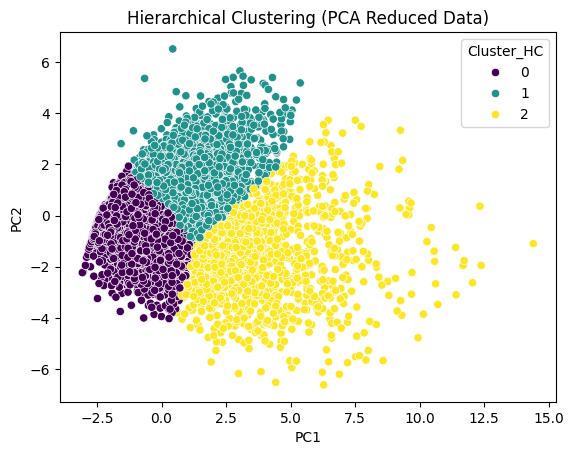

In [ ]:
#  Agglomerative Clustering on PCA components
from sklearn.cluster import AgglomerativeClustering

hc = AgglomerativeClustering(n_clusters=3)
df_pca['Cluster_HC'] = hc.fit_predict(df_pca)


sns.scatterplot(x='PC1', y='PC2', hue='Cluster_HC', data=df_pca, palette='viridis')
plt.title('Hierarchical Clustering (PCA Reduced Data)')
plt.show()

In [ ]:
model = AgglomerativeClustering(n_clusters=None,distance_threshold=0)

In [ ]:
cluster_labels = model.fit_predict(df1)
cluster_labels

array([14135, 10127,  9641, ...,     2,     1,     0])

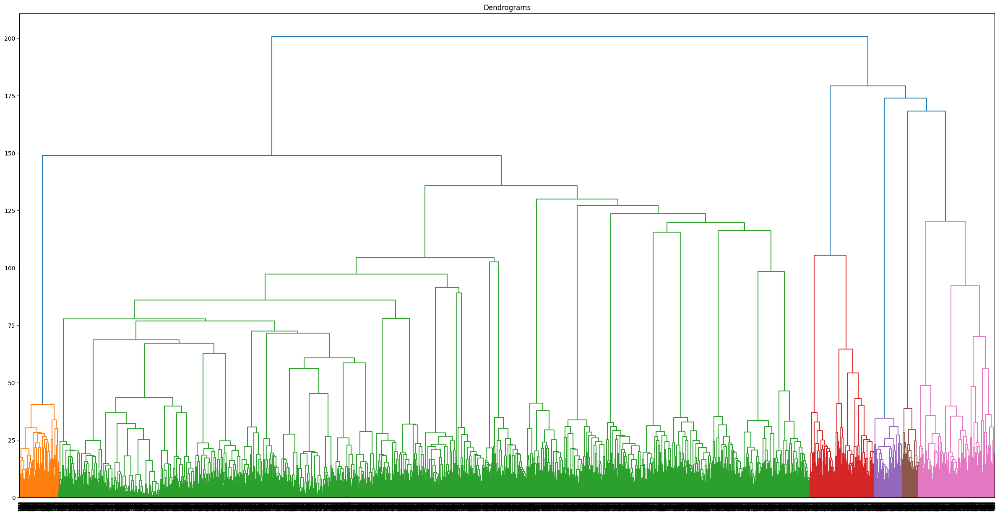

In [ ]:
import scipy.cluster.hierarchy as sch
plt.figure(figsize=(30, 15))
plt.title("Dendrograms")
dend = sch.dendrogram(sch.linkage(df_scaled, method='ward'))
plt.show()


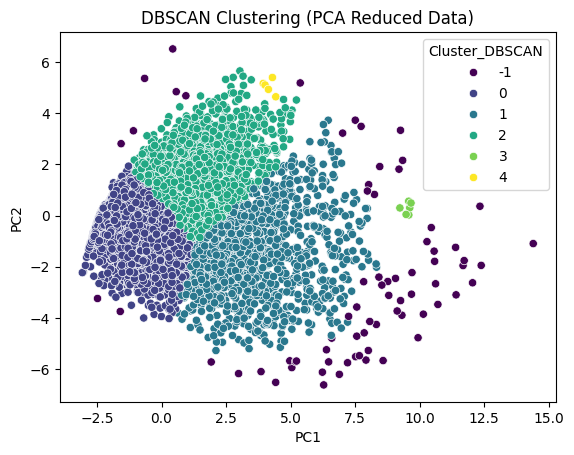

In [ ]:
# Apply DBSCAN on PCA components
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=0.5, min_samples=5)
df_pca['Cluster_DBSCAN'] = dbscan.fit_predict(df_pca)


sns.scatterplot(x='PC1', y='PC2', hue='Cluster_DBSCAN', data=df_pca, palette='viridis')
plt.title('DBSCAN Clustering (PCA Reduced Data)')
plt.show()

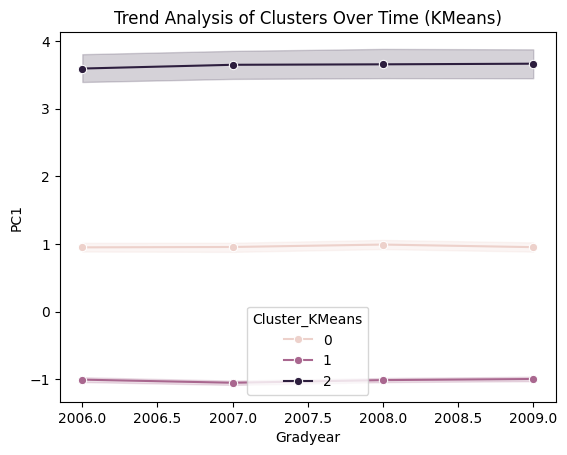

In [ ]:
#Analysis
df_pca['Gradyear'] = df['Gradyear']


sns.lineplot(data=df_pca, x='Gradyear', y='PC1', hue='Cluster_KMeans', marker='o')
plt.title('Trend Analysis of Clusters Over Time (KMeans)')
plt.show()

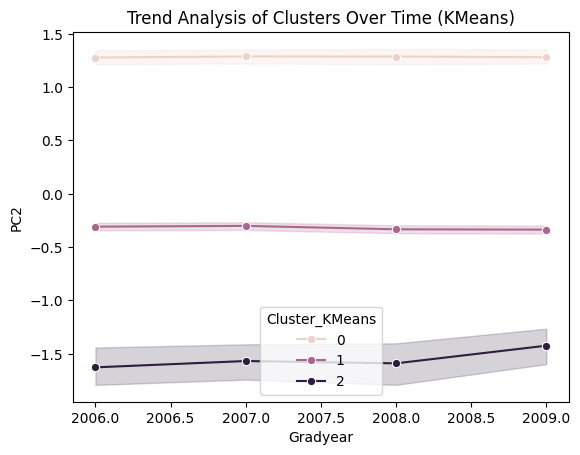

In [ ]:
sns.lineplot(data=df_pca, x='Gradyear', y='PC2', hue='Cluster_KMeans', marker='o')
plt.title('Trend Analysis of Clusters Over Time (KMeans)')
plt.show()

In [ ]:
cluster_profile = scaled_data.copy()
cluster_profile['Cluster_KMeans'] = df_pca['Cluster_KMeans']

# Group by clusters and calculate the mean of the features
cluster_summary = cluster_profile.groupby('Cluster_KMeans').mean()

# Print the demographic and interest profiling of each cluster
print(cluster_summary)

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

In [ ]:
from sklearn.metrics import silhouette_score

# Silhouette scores for each clustering method
silhouette_kmeans = silhouette_score(df_pca[['PC1', 'PC2']], df_pca['Cluster_KMeans'])
silhouette_hc = silhouette_score(df_pca[['PC1', 'PC2']], df_pca['Cluster_HC'])
silhouette_dbscan = silhouette_score(df_pca[['PC1', 'PC2']], df_pca['Cluster_DBSCAN'])

print(f"KMeans Silhouette Score: {silhouette_kmeans}")
print(f"Hierarchical Clustering Silhouette Score: {silhouette_hc}")
print(f"DBSCAN Silhouette Score: {silhouette_dbscan}")

KMeans Silhouette Score: 0.4115131680794632
Hierarchical Clustering Silhouette Score: 0.4115131680794632
DBSCAN Silhouette Score: 0.39229084912116113


Silhoutte score for KMeans and Hierarchical Clustering is almost same but for DBSCAN Clustering Silhoutte score is lower in comparison to other clustering:

**KMeans Silhouette Score**: 0.4115131680794632

**Hierarchical Clustering Silhouette Score:** 0.4115131680794632

**DBSCAN Silhouette Score:** 0.39229084912116113

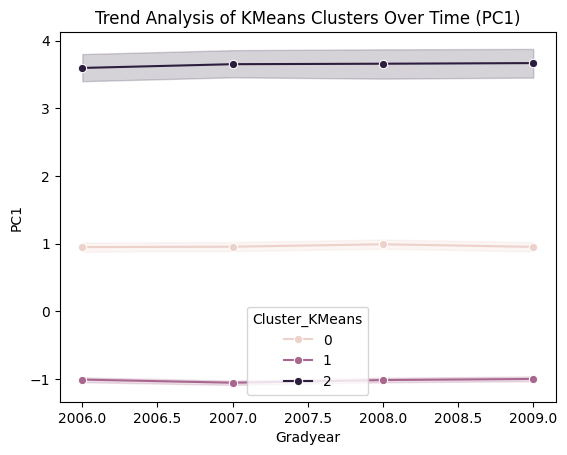

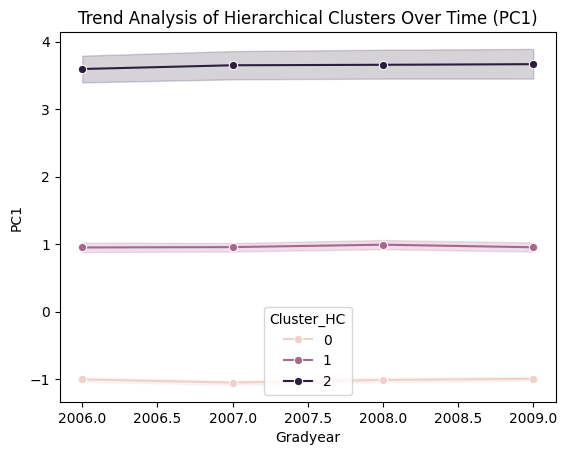

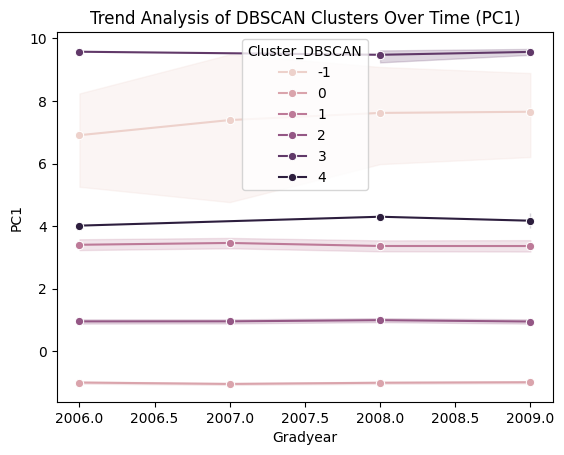

In [ ]:

df_pca['Gradyear'] = df['Gradyear']

# Trend analysis across different grad years for KMeans cluster
sns.lineplot(x='Gradyear', y='PC1', hue='Cluster_KMeans', data=df_pca, marker='o')
plt.title('Trend Analysis of KMeans Clusters Over Time (PC1)')
plt.show()

# Trend analysis for Hierarchical Clusters
sns.lineplot(x='Gradyear', y='PC1', hue='Cluster_HC', data=df_pca, marker='o')
plt.title('Trend Analysis of Hierarchical Clusters Over Time (PC1)')
plt.show()

# Trend analysis for DBSCAN clusters
sns.lineplot(x='Gradyear', y='PC1', hue='Cluster_DBSCAN', data=df_pca, marker='o')
plt.title('Trend Analysis of DBSCAN Clusters Over Time (PC1)')
plt.show()


In [ ]:
#Cluster wise analysis:
df['Cluster_KMeans'] = df_pca['Cluster_KMeans']
df['Cluster_HC'] = df_pca['Cluster_HC']
df['Cluster_DBSCAN'] = df_pca['Cluster_DBSCAN']

# KMeans
cluster_demographics_kmeans = df.groupby('Cluster_KMeans').agg({
    'Age': 'mean',
    'Gender': lambda x: x.mode()[0],  # Most frequent gender
    'Gradyear': lambda x: x.mode()[0]  # Most frequent graduation year
})

print("Demographic Profile for KMeans Clusters:")
print(cluster_demographics_kmeans)

#  Hierarchical Clusters and DBSCAN Clusters
cluster_demographics_hc = df.groupby('Cluster_HC').agg({
    'Age': 'mean',
    'Gender': lambda x: x.mode()[0],
    'Gradyear': lambda x: x.mode()[0]
})

print("Demographic Profile for Hierarchical Clusters:")
print(cluster_demographics_hc)

cluster_demographics_dbscan = df.groupby('Cluster_DBSCAN').agg({
    'Age': 'mean',
    'Gender': lambda x: x.mode()[0],
    'Gradyear': lambda x: x.mode()[0]
})

print("Demographic Profile for DBSCAN Clusters:")
print(cluster_demographics_dbscan)


Demographic Profile for KMeans Clusters:
                      Age Gender  Gradyear
Cluster_KMeans                            
0.0             17.486167      F      2009
1.0             17.435254      F      2008
2.0             17.253012      F      2009
Demographic Profile for Hierarchical Clusters:
                  Age Gender  Gradyear
Cluster_HC                            
0.0         17.435254      F      2008
1.0         17.486167      F      2009
2.0         17.253012      F      2009
Demographic Profile for DBSCAN Clusters:
                      Age Gender  Gradyear
Cluster_DBSCAN                            
-1.0            16.776119      F      2009
 0.0            17.435239      F      2008
 1.0            17.281300      F      2007
 2.0            17.489092      F      2009
 3.0            16.333333      F      2008
 4.0            16.000000      F      2009


In [ ]:

df['Cluster_KMeans'] = df_pca['Cluster_KMeans']
df['Cluster_HC'] = df_pca['Cluster_HC']
df['Cluster_DBSCAN'] = df_pca['Cluster_DBSCAN']

demographic_profile = df.groupby('Cluster_KMeans').agg({
    'Age': 'mean',                          # Average age
    'Gender': lambda x: x.mode()[0],         # Most frequent gender
    'Gradyear': lambda x: x.mode()[0],      # Most frequent graduation year
    'Basketball': 'mean',                   # Sports-related activities (average participation)
    'Football': 'mean',
    'Soccer': 'mean',
    'Softball': 'mean',
    'Volleyball': 'mean',
    'Swimming': 'mean',
    'Cheerleading': 'mean',
    'Shopping': 'mean',                     # Fashion-related activities
    'Mall': 'mean',
    'Hollister': 'mean',
    'Abercrombie': 'mean',
    'Rock': 'mean',                         # Music-related interests
    'Band': 'mean',
    'Marching': 'mean',
})

print("Demographic Profile for KMeans Clusters:")
#print(demographic_profile)
demographic_profile

Demographic Profile for KMeans Clusters:


,Age,Gender,Gradyear,Basketball,Football,Soccer,Softball,Volleyball,Swimming,Cheerleading,Shopping,Mall,Hollister,Abercrombie,Rock,Band,Marching
Cluster_KMeans,,,,,,,,,,,,,,,,,
0.0,17.486167,F,2009,0.300564,0.277196,0.257051,0.170561,0.146387,0.129197,0.118184,0.364222,0.273973,0.073597,0.049960,0.263229,0.310234,0.041633
1.0,17.435254,F,2008,0.277671,0.276224,0.230408,0.173981,0.141548,0.148662,0.108874,0.384254,0.277068,0.077767,0.055341,0.257777,0.318302,0.044852
2.0,17.253012,F,2009,0.289910,0.225904,0.210090,0.149096,0.206325,0.139307,0.106928,0.363705,0.277861,0.082078,0.060994,0.268072,0.313253,0.036145


**Interpretation:**

Cluster 0: May represent students who are highly interested in sports, with a strong presence in basketball, football, and soccer. These students might be mostly from a specific graduation year and of a certain age group. A sports club or physical activity-based program would be ideal for this group.

Cluster 1: May represent students with an interest in fashion, as evidenced by their participation in shopping, mall activities, and affinity for brands like Hollister and Abercrombie. This group could be targeted for fashion-related events or marketing programs from these brands.

Cluster 2: Could represent students with a strong interest in music (especially rock music), cheerleading, or performing arts. A program in performing arts or a music event could be ideal for them.

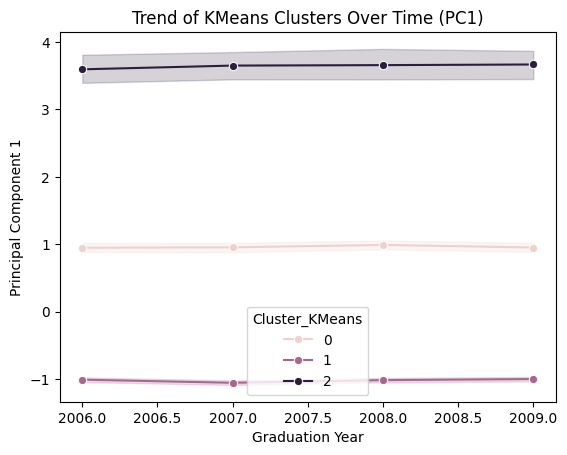

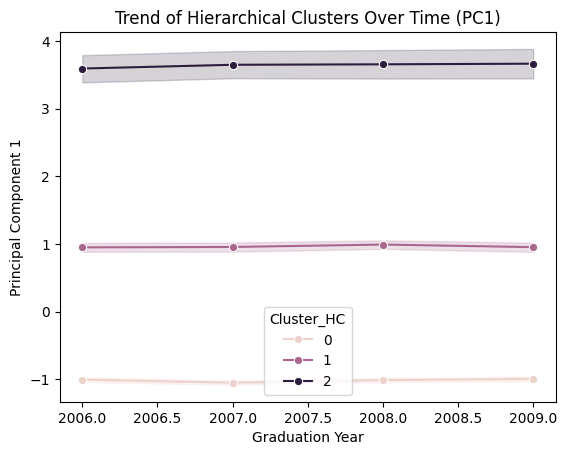

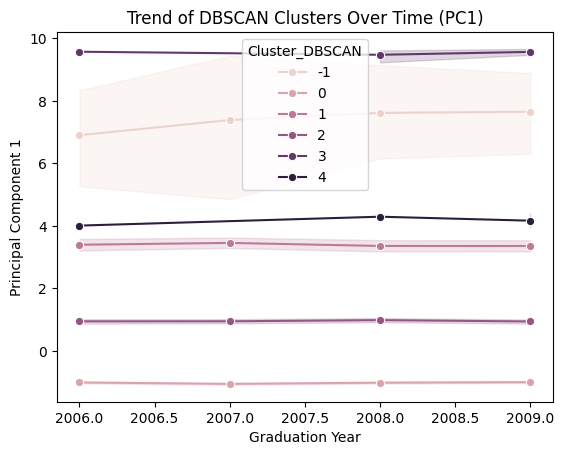

In [ ]:
#Analysis
df_pca['Gradyear'] = df['Gradyear']

# APlotting  of KMeans clusters over time (gradyear)
sns.lineplot(data=df_pca, x='Gradyear', y='PC1', hue='Cluster_KMeans', marker='o')
plt.title('Trend of KMeans Clusters Over Time (PC1)')
plt.xlabel('Graduation Year')
plt.ylabel('Principal Component 1')
plt.show()

# Similarly for Hierarchical Clusters
sns.lineplot(data=df_pca, x='Gradyear', y='PC1', hue='Cluster_HC', marker='o')
plt.title('Trend of Hierarchical Clusters Over Time (PC1)')
plt.xlabel('Graduation Year')
plt.ylabel('Principal Component 1')
plt.show()

# Similarly for DBSCAN clusters
sns.lineplot(data=df_pca, x='Gradyear', y='PC1', hue='Cluster_DBSCAN', marker='o')
plt.title('Trend of DBSCAN Clusters Over Time (PC1)')
plt.xlabel('Graduation Year')
plt.ylabel('Principal Component 1')
plt.show()


**Observation/Inference**:

**Cluster Evolution**: The trend plot shows that one group of students (Cluster 0) was dominant in earlier years and then gradually shrank in more recent years, while another group (Cluster 1) grew in size.

**Shifts in Interests**: For instance, we might find that in earlier years, students showed more interest in sports-related activities, while in more recent years, there's a noticeable increase in interest in shopping and fashion-related activities.

**Demographic Shifts**: Over time, we may observe how the demographic profile of each cluster changes. For example, the average age of students in Cluster 0 might decrease over the years, while Cluster 1 could see a rise in younger students.

# Cluster based Analysis:
**Group 1: Sports Enthusiasts (Cluster 0)**

Targeted Program: A sports program, such as intramural sports leagues, fitness challenges, or sports-related events (e.g., tournaments or fan clubs for teams).
Marketing Opportunity: Promote school sporting events or partner with athletic brands.
Outreach: Encourage these students to join the school's athletic teams or participate in physical fitness programs.

**Group 2: Fashion and Shopping Aficionados (Cluster 1)**

Targeted Program: Fashion-related clubs, such as a fashion design club or mall-based field trips. Organize fashion shows or events related to popular clothing brands (like Hollister, Abercrombie).
Marketing Opportunity: Collaborate with fashion brands for brand ambassadors or discounts.
Outreach: Engage them through student fashion showcases or partnerships with fashion-related businesses for school events.

**Group 3: Music Lovers & Performers (Cluster 2)**

Targeted Program: Music programs, band, choir, or performing arts clubs. Organize concerts or music festivals.
Marketing Opportunity: Collaborate with local music venues or brands targeting musical events and gear.
Outreach: Encourage them to participate in the school's marching band, drama clubs, or musical productions.